# Monte Carlo Simulations for Portfolio Optimization
----



## Package installation

In [ ]:
#Necessary Packages:
import pandas as pd
import pandas_datareader as web
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sea
import itertools


%matplotlib inline 

## Stock gathering

In [ ]:

#Gather closing prices from yfinance 
start = datetime(2019,6,1)
end = datetime(2022,1,1)
#Vietnamese stocks to be used 
# can fill stock name here
stocks = [
    "VIC",
    "VHM",
    "GAS",
    "VCB",
    "HPG",
    "TCB",
    "FPT",
    "HVN",
    "VJC",
    "BHN",
    "MSB",
    "VPB",
    "HSG",
    "PNJ",
    "NVL", "ABC"]


In [ ]:
# Choose the stock with the time above and add it to datâ
import yfinance as yf

data = yf.download(stocks, start=start, end=end)['Close']
data = data.dropna()
print(len(data))
print(data)


[*********************100%***********************]  16 of 16 completed
646
                   ABC       BHN      FPT       GAS           HPG      HSG  \
Date                                                                         
2019-06-03   80.370003   99000.0  43500.0  101400.0  24230.800781   7810.0   
2019-06-04   82.209999  102800.0  43300.0  102000.0  24300.000000   7820.0   
2019-06-05   81.650002   99100.0  43600.0  102000.0  23800.000000   7770.0   
2019-06-06   81.750000  103000.0  44500.0   99800.0  22700.000000   7640.0   
2019-06-07   83.480003   97000.0  45200.0  103000.0  22950.000000   7640.0   
...                ...       ...      ...       ...           ...      ...   
2021-12-27  131.899994   60300.0  94500.0   95900.0  45900.000000  35250.0   
2021-12-28  132.360001   60300.0  94500.0   98100.0  45800.000000  35900.0   
2021-12-29  133.339996   60000.0  93600.0   97000.0  45800.000000  36900.0   
2021-12-30  133.770004   59900.0  93600.0   97000.0  45700.000000  

Once the required data is collected, it becomes possible to calculate the fundamental risk and return measurements, namely the average annual returns and the asset covariances. Average yearly returns are crucial for determining the overall return of a portfolio, while covariances are essential for calculating the variance and standard deviation, which reflect the portfolio's risk or volatility.






## Data description


### Data information and price variation 

              ABC            BHN           FPT            GAS           HPG  \
count  646.000000     646.000000    646.000000     646.000000    646.000000   
mean   101.513065   67693.808050  64352.046155   88212.074303  33782.875068   
std     14.466968   12928.686644  18730.747625   14238.938088  13558.687802   
min     73.930000   40950.000000  35130.398438   53900.000000  13500.000000   
25%     87.629997   57325.000000  48700.000000   75200.000000  22550.000000   
50%     98.955002   66850.000000  56500.000000   89000.000000  25775.000000   
75%    116.672503   75600.000000  82050.000000   99800.000000  47100.000000   
max    133.770004  103000.000000  99400.000000  125000.000000  63000.000000   

                HSG           HVN         MSB            NVL            PNJ  \
count    646.000000    646.000000  646.000000     646.000000     646.000000   
mean   20048.753466  28740.451707   25.164783   66480.094143   80028.908669   
std    13961.553467   5756.481557    6.590486   231

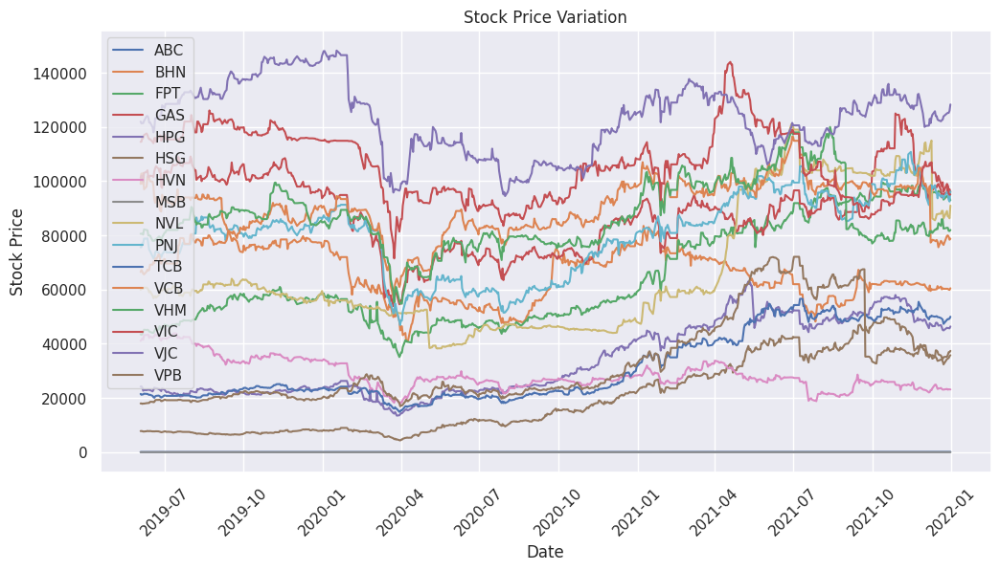

In [ ]:
## Data description and stock price variation

print(data.describe())
import pandas as pd
import matplotlib.pyplot as plt

# Plot line charts for each stock
plt.figure(figsize=(12, 6))  # figure size

for column in data.columns:
    plt.plot(data.index, data[column], label=column)

plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.title('Stock Price Variation')
plt.legend(loc='upper left')
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.show()

### Boxplot for each stock

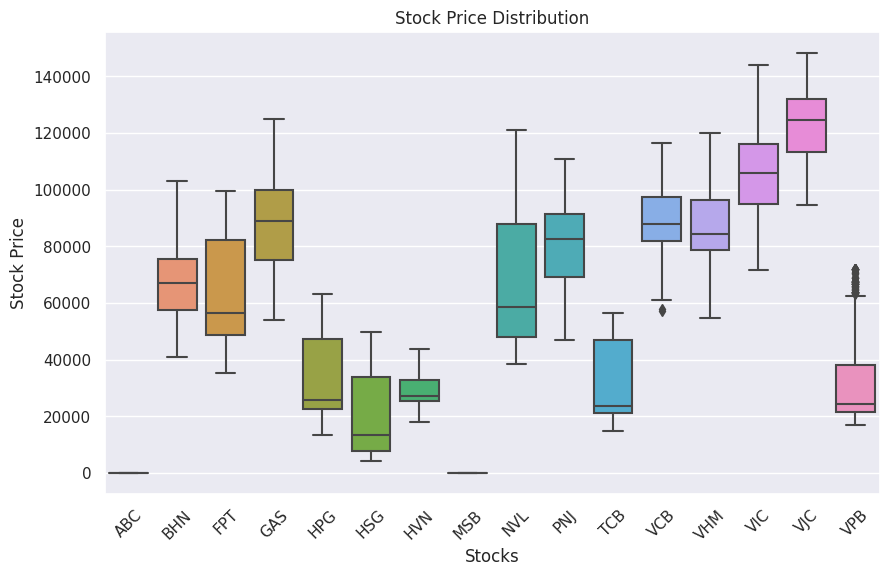

In [ ]:
import seaborn as sns
# Create a box plot for each stock
plt.figure(figsize=(10, 6))  # Adjust the figure size 

sns.boxplot(data=data)
plt.xlabel('Stocks')
plt.ylabel('Stock Price')
plt.title('Stock Price Distribution')
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.show()

### Scatter plot among pairs of stock

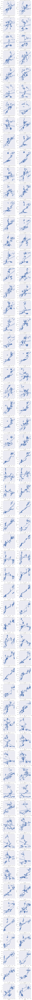

In [ ]:
# Generate all possible combinations of pairs among the stock names
stock_combinations = list(itertools.combinations(stocks, 2))

# Set up the subplot layout
num_plots = len(stock_combinations)
num_rows = (num_plots + 1) // 2

# Create scatter plots with regression lines for pairs of stocks
fig, axes = plt.subplots(num_rows, 2, figsize=(12, 6 * num_rows))

for i, combination in enumerate(stock_combinations):
    row = i // 2
    col = i % 2

    stock1, stock2 = combination

    sns.regplot(x=data[stock1], y=data[stock2], ax=axes[row, col])
    axes[row, col].set_xlabel(stock1 + ' Price')
    axes[row, col].set_ylabel(stock2 + ' Price')
    axes[row, col].set_title('Scatter Plot with Regression Line: ' + stock1 + ' vs ' + stock2)

# Adjust the layout if there are any empty subplots
if num_plots % 2 != 0:
    fig.delaxes(axes[num_rows-1, 1])

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

## Create simulation

### Prepare

In [ ]:
#Annual returns and covariance matrix:
yearly_ret = data.resample('Y').last().pct_change().mean()
cov = data.pct_change().cov()


- All the data and needed metrics are done. This just leaves the necessary components of the simulations to be set, which include an empty storage system (here being a Pandas DataFrame), the number of stocks to create random weights, the number of randomly generated portfolios to make each simulation, and the total number of simulations:

In [ ]:
#Empty DataFrame to store generated portfolios of max return, min vol, max Sharpe:
sim_port = pd.DataFrame()

#Number of simulations/portfolios and number of weights:
num_weights = len(stocks)
ports = 5000
sims = 2500

num_weights   #Show number of weights that need to be made

16

### Now create simulation

- Everything is ready for the model to be built and processed. Now, two for loops are needed. One is for each simulation and the other for each randomly generated portfolio in the simulation. Each simulation needs to have the metrics stored as well, so empty lists are made for this. Then, the weights need to be generated randomly so the returns, volatilities, and Sharpe ratios can be calculated for each portfolio. These can then be placed into a dictionary, which can then be turned into a Pandas DataFrame. Pandas then offers easy functions that allows for us to identify the maximum or minimum values as desired, which are added to the initial empty DataFrame created above.


- Note, **the code takes a while to run due to large amounts of portfolios and simulations.** Also, the risk-free rate used is 1%, a usual value for a simple implementation:

In [ ]:
#Loop to make 2500 simulations:
for sim in range(sims):
    #Empty lists to hold portfolio info:
    rets, volas, wgts, sharpe_ratio = [], [], [], []
    
    #Loop to make random 5000 portfolios:
    for port in range(ports):
        
        #Weights generation:
        ws = np.random.random(num_weights)   #Random positive floats for each stock
        ws = ws/ws.sum()                     #Standardize for weights to add to 1
        wgts.append(ws)                      #Add them to list
        
        #Returns Calculations:
        ret = np.dot(ws, yearly_ret)    #Weighted sum with dot product
        rets.append(ret)                #Add it to list
        
        #Volatility Calculation:
        var = np.dot(ws.T, np.dot(cov, ws))     #variance = weights.T*Cov*weights
        yearly_vol = np.sqrt(var)*np.sqrt(252)  #Std = sqrt(var), times sqrt(252) gives annual vol
        volas.append(yearly_vol)                #Add it to list
        
        #Sharpe Ratio Calculation: 
        sharpe = (ret - 0.01) / yearly_vol    #(Returns - risk-free) / volatility
        sharpe_ratio.append(sharpe)           #Add to list
    
    #Add list of portfolios made to a dictionary:
    ports_dict = {'Returns':rets, 'Risk':volas,'Sharpe_R':sharpe_ratio}
    
    #Placing weights with stock symbol into the dict above:
    for counter, sym in enumerate(data.columns.tolist()):
        ports_dict[sym+'_Weight'] = [weight[counter] for weight in wgts]
    
    #Make DataFrame out of dictionary:
    ports_df = pd.DataFrame(ports_dict)
    
    #Place Max return, min vol, and max Sharpe portfolios in new DataFrame:
        #Sharpe Ratio = (return - risk-free return) / volatility
    max_ret = ports_df.iloc[ports_df.Returns.idxmax()]     #Max return portfolio made
    min_vol = ports_df.iloc[ports_df.Risk.idxmin()]        #Min volatility portfolio made
    max_sharpe = ports_df.iloc[ports_df.Sharpe_R.idxmax()] #Max Sharpe Ratio portfolio made
    
    #Store simulation results in empty DataFrame previously made:
    sim_port = sim_port.append([max_ret,min_vol,max_sharpe], ignore_index=True)

<ipython-input-96-61e4d0d0a98c>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sim_port = sim_port.append([max_ret,min_vol,max_sharpe], ignore_index=True)
<ipython-input-96-61e4d0d0a98c>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sim_port = sim_port.append([max_ret,min_vol,max_sharpe], ignore_index=True)
<ipython-input-96-61e4d0d0a98c>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sim_port = sim_port.append([max_ret,min_vol,max_sharpe], ignore_index=True)
<ipython-input-96-61e4d0d0a98c>:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sim_port = sim_port.append([max_ret,min_vol,max_sharpe], ignore_index=True)
<ipython-inp

- The aggregated simulation results can be checked by showing just a small portion of the DataFrame made. This allows for each specific metric of each portfolio to be seen along with the specific allocation needed for each asset out of 1:

## Visualization of result for discussion

In [ ]:
sim_port.head()

,Returns,Risk,Sharpe_R,ABC_Weight,BHN_Weight,FPT_Weight,GAS_Weight,HPG_Weight,HSG_Weight,HVN_Weight,MSB_Weight,NVL_Weight,PNJ_Weight,TCB_Weight,VCB_Weight,VHM_Weight,VIC_Weight,VJC_Weight,VPB_Weight
0,0.365814,0.225132,1.580468,0.093372,0.022754,0.059740,0.006515,0.093522,0.134163,0.030483,0.020265,0.062009,0.005522,0.131195,0.116357,0.012737,0.016654,0.060528,0.134182
1,0.103459,0.174695,0.534985,0.136938,0.086959,0.001910,0.011427,0.039617,0.024649,0.043452,0.026297,0.104335,0.093525,0.003574,0.046308,0.106890,0.119838,0.123101,0.031180
2,0.336064,0.201228,1.620371,0.133931,0.016020,0.067570,0.022558,0.066328,0.120373,0.032643,0.091134,0.122356,0.016649,0.135402,0.085435,0.059994,0.021122,0.001429,0.007055
3,0.396632,0.242769,1.592590,0.041186,0.040280,0.019888,0.133463,0.020414,0.229216,0.065418,0.014133,0.016613,0.030568,0.107021,0.006660,0.003994,0.019806,0.124365,0.126975
4,0.138856,0.176022,0.732047,0.142632,0.031897,0.059638,0.020878,0.021636,0.020080,0.031536,0.037418,0.090117,0.106343,0.073357,0.021203,0.071045,0.125137,0.133844,0.013240


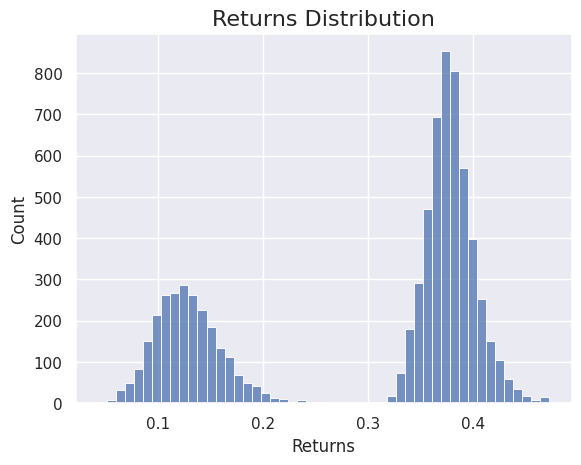

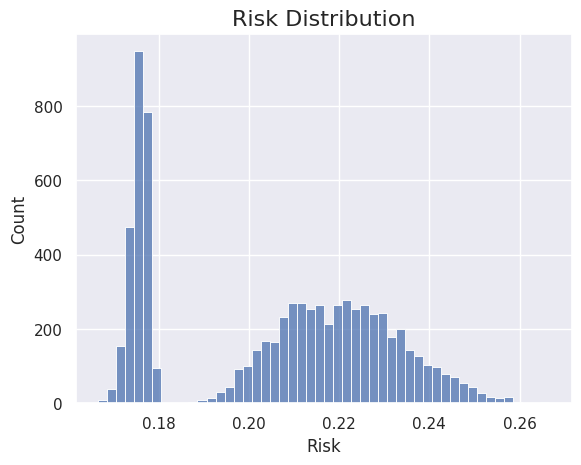

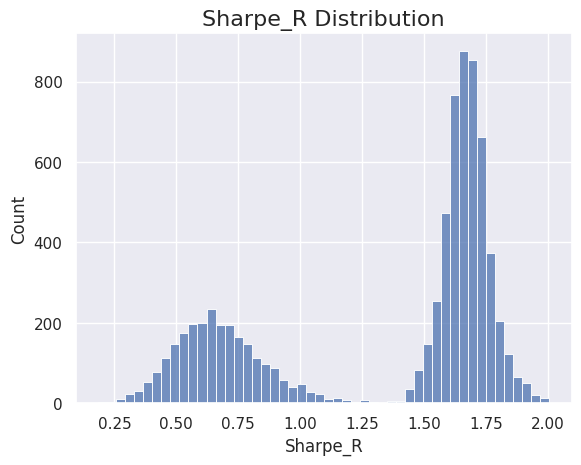

In [ ]:
#Plot histograms for Return, Volatility, and Sharpe Distributions:
sea.set_theme()

for col in sim_port.columns[:3]:
    plt.figure()
    sea.histplot(sim_port[col], bins=50)
    plt.title(col + ' Distribution', fontsize=16)
    plt.show()

For investors seeking to maximize returns, the green star portfolio stands out as a favorable choice on the scatter plot. It represents a portfolio with an optimal balance between risk and return, offering potentially higher returns compared to other portfolios.
On the other hand, investors prioritizing risk minimization above all else can opt for the red star portfolio. Positioned on the scatter plot, it represents a portfolio with the lowest level of risk compared to the other portfolios evaluated.
The scatter plot thus provides a visual representation of the trade-off between risk and return, allowing investors to make informed decisions based on their specific investment objectives.

As an example, it is clear how the maximum Sharpe ratio portfolio (yellow star) is a better choice than the average metrics portfolio (purple star) since it has a much higher return while still having a smaller amount of risk. That's why the Sharpe ratio is a widely used metric that compares portfolio returns to the risk-free rate and overall portfolio risk.

By using a basic filter in the output dataset, we can choose our desired portfolio with wanted properties based on the analysis.


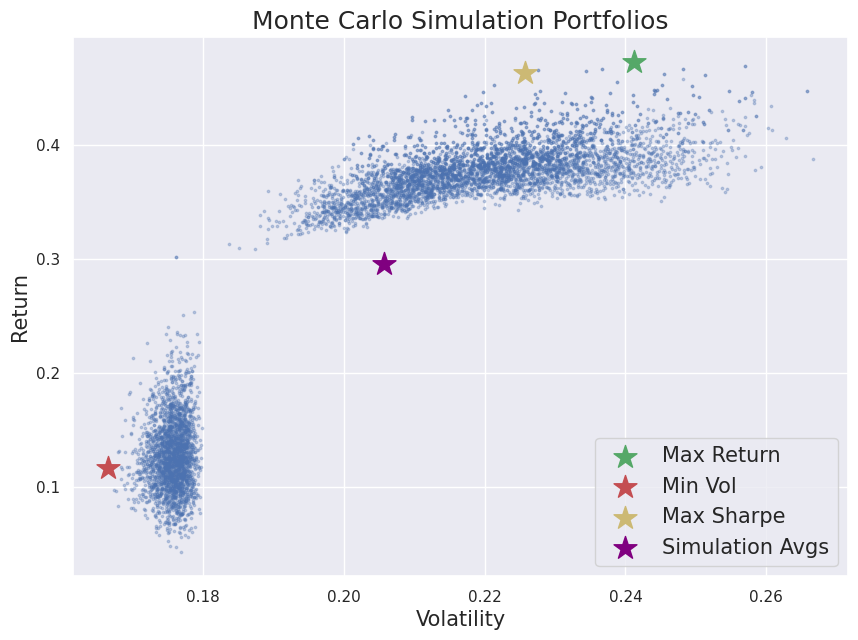

In [ ]:
#Plotting All Portfolios, extremes (ex: max return), and average portfolio:
sim_max_return = sim_port.iloc[sim_port.Returns.idxmax()]   #Max return found in simulations
sim_min_vol = sim_port.iloc[sim_port.Risk.idxmin()]         #Min risk found
sim_max_sharpe = sim_port.iloc[sim_port.Sharpe_R.idxmax()]  #Max Sharpe Ratio found
sim_mean = sim_port.mean()                                  #Average portfolio found

#Making figure and plotting portfolios on a scatter plot:
plt.figure(figsize=(10,7)) 
plt.scatter(sim_port.Risk, sim_port.Returns, alpha=0.3, s=3)       
plt.scatter(sim_max_return[1], sim_max_return[0], s=300, c='g', marker='*',label='Max Return')
plt.scatter(sim_min_vol[1], sim_min_vol[0], s=300, c='r', marker='*', label='Min Vol')       
plt.scatter(sim_max_sharpe[1], sim_max_sharpe[0], s=300, marker='*', c='y', label='Max Sharpe') 
plt.scatter(sim_mean[1], sim_mean[0], s=300, c='purple', marker='*', label='Simulation Avgs') 
             
#Setting appropriate labels:
plt.xlabel('Volatility', fontsize=15)     
plt.ylabel('Return', fontsize=15)
plt.title('Monte Carlo Simulation Portfolios', fontsize=18)  
plt.legend(loc='lower right', fontsize=15)

plt.show()

For investors seeking to maximize returns, the green star portfolio stands out as a favorable choice on the scatter plot. It represents a portfolio with an optimal balance between risk and return, offering potentially higher returns compared to other portfolios.
On the other hand, investors prioritizing risk minimization above all else can opt for the red star portfolio. Positioned on the scatter plot, it represents a portfolio with the lowest level of risk compared to the other portfolios evaluated.
The scatter plot thus provides a visual representation of the trade-off between risk and return, allowing investors to make informed decisions based on their specific investment objectives.


As an example, it is clear how the maximum Sharpe ratio portfolio (yellow star) is a better choice than the average metrics portfolio (purple star) since it has a much higher return while still having a smaller amount of risk. That's why the Sharpe ratio is a widely used metric that compares portfolio returns to the risk-free rate and overall portfolio risk.


## Conclusion
---


These three approaches demonstrate how Monte Carlo simulations can be used to improve portfolio allocation. However, there are challenges involved in this application. As technology progresses, it remains an effective tool, but accurate assumptions and data are necessary. Additionally, the computational complexity can be demanding, as it requires generating numerous random scenarios and simulating portfolio performance for each one. Despite these challenges, Monte Carlo simulations offer valuable insights for investors and financial analysts.


## References:



Detemple, J. B., Garcia,s R., & Rindisbacher, M. (2003). A Monte Carlo Method for Optimal Portfolios. The Journal of Finance, 58(1), 401–446. http://www.jstor.org/stable/3094492. 

K. Eisenhardt, Building Theories from Case-Study Research, Academy of Management Review 14/4 (1989)116–121. 

I.T. Nemuth, Practical Use of Monte Carlo Simulation for Risk Management within the International Construction Industry, In Grauber, Schmidt & Proske:

Proceedings of the 6th International Probabilistic Workshop, Darmstadt, 2008.
Towardsdatascience, https://towardsdatascience.com/optimization-with-python-how-to-make-the-most-amount-of-money-with-the-least-amount-of-risk-1ebebf5b2f29

B. Postace, Wordpress,  https://insightr.wordpress.com/2017/08/27/pricing-optimization-how-to-find-the-price-that-maximizes-your-profit/
